<a href="https://colab.research.google.com/github/ronakvijay/Dstl-Satellite-Imagery-Feature-Detection/blob/master/DSTL_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dstl Satellite Imagery Feature Detection: 1

<center>
<img src='https://cdn-sv1.deepsense.ai/wp-content/uploads/2019/02/deep-learning-for-satellite-imagery-via-image-segmentation-1140x337.jpg'>
</center>

## 1. Business/Real-world Problem

### 1.1 Description

The proliferation of satellite imagery has given us a radically improved understanding of our planet. It has enabled us to better achieve everything from mobilizing resources during disasters to monitoring effects of global warming. What is often taken for granted is that advancements such as these have relied on labeling features of significance like building footprints and roadways fully by hand or through imperfect semi-automated methods.

Automating feature labelling of such multispectral geo images could greatly help in many applications, such as creating and keeping up-to-date maps, improving urban planning, environment monitoring and disaster relief.


### 1.2 Problem Statement

- Semantic segmentation of different classes in satellite imagery.

- In other words, we have to detect and classify the 10 different types of objects found in earth's geospatial images taken by the satellite. For example of semantic segmentation, see the below image.

- The data is provided by [Dstl](https://en.wikipedia.org/wiki/Defence_Science_and_Technology_Laboratory) (Defence Science and Technology Laboratory) from [WorldView-3](https://en.wikipedia.org/wiki/WorldView-3) satellite.

- Source: [Kaggle](https://www.kaggle.com/c/dstl-satellite-imagery-feature-detection)

<center><img src='https://deepsense.ai/wp-content/uploads/2017/04/sample_image_from_the_training_set.jpg' width=700px, height=300px> </center>

### 1.4 Real-world/Business objectives and constraints

1. Minimize Jaccard Index.
2. No latency concerns.






## 2. Machine Learning Problem

### 2.1 Data Overview

__General Description__
- Source: https://www.kaggle.com/c/dstl-satellite-imagery-feature-detection/data

- 1km x 1km area high-resolution satellite images in both 3-band and 16-band formats are given.

<center><img src='https://i0.wp.com/blog.kaggle.com/wp-content/uploads/2017/04/image20.png?w=971'></center>

- [*Spectral Bands*](https://en.wikipedia.org/wiki/Multispectral_image):  Spectral bands in a multispectral image refers to different channels in the [electromagnetic spectrum](https://en.wikipedia.org/wiki/Electromagnetic_spectrum) w.r.t wavelength of light.
  
- For each image we are given with three versions: grayscale, 3-band and 16-band. Details are presented in the table below:

<table> <tbody> <tr> <td><strong>Type</strong></td> <td><strong>Wavebands</strong></td> <td><strong>Pixel resolution</strong></td> <td><strong>#channels</strong></td> <td><strong>Size</strong></td> </tr> <tr> <td>grayscale</td> <td>Panchromatic</td> <td>0.31&nbsp;m</td> <td>1</td> <td>3348&nbsp;x 3392</td> </tr> <tr> <td>3-band</td> <td>RGB</td> <td>0.31&nbsp;m</td> <td>3</td> <td>3348&nbsp;x 3392</td> </tr> <tr> <td rowspan="2">16-band</td> <td>Multispectral</td> <td>1.24&nbsp;m</td> <td>8</td> <td>837&nbsp;x 848</td> </tr> <tr> <td>Short-wave infrared</td> <td>7.5&nbsp;m</td> <td>8</td> <td>134&nbsp;x 136</td> </tr> </tbody> </table>

<center>
<img src='https://i2.wp.com/blog.kaggle.com/wp-content/uploads/2017/04/image12.png?resize=856%2C658'>
</center>
   
- Images are in [GeoTIFF](https://en.wikipedia.org/wiki/GeoTIFF)(Tagged Image File Format) , which is a computer file format for storing   raster(pixel) graphics images with no compression like in JPEG.

- _Object Types:_ We have to classify objects into one of these classes.

  1. Buildings - large building, residential, non-residential, fuel storage facility, fortified building.
  2. Misc - Manmade structures. 
  3. Road. 
  4. Track - poor/dirt/cart track, footpath/trail.
  5. Trees - woodland, hedgerows, groups of trees, standalone trees.
  6. Crops - contour ploughing/cropland, grain (wheat) crops, row (potatoes, turnips) crops.
  7. Waterway. 
  8. Standing water.
  9. Vehicle Large - large vehicle (e.g. lorry, truck,bus), logistics vehicle.
  10. Vehicle Small - small vehicle (car, van), motorbike.
  
---

__File Description__

- train_wkt.csv - the [WKT](https://en.wikipedia.org/wiki/Well-known_text_representation_of_geometry) format of all the training labels
- three_band.zip - the complete dataset of 3-band satellite images. The three bands are in the images with file name = {ImageId}.tif.
- sixteen_band.zip - the complete dataset of 16-band satellite images. The 16 bands are distributed in the images with file name = {ImageId}_{A/M/P}.tif.
- grid_sizes.csv - the sizes of grids for all the images
ImageId - ID of the image
  - Xmax - maximum X coordinate for the image.
  - Ymin - minimum Y coordinate for the image.
- train_geojson.zip - the [geojson](https://en.wikipedia.org/wiki/GeoJSON) format of all the training labels (essentially these are the same information as train_wkt.csv). 

---

__Data Fields(train_wkt.csv)__

- ImageId - ID of the image.
- ClassType - type of objects (1-10).
- MultipolygonWKT - the labeled area, which is multipolygon geometry represented in WKT format. 

### 2.2 Mapping the real world problem to a ML problem

#### 2.2.1 Type of Machine Learning Problem

This is a multi class semantic segmentation problem, where we have to label each pixel of an image with a corresponding class of 10 different objects.

####  2.2.2 Performance Metric

Source: https://www.kaggle.com/c/dstl-satellite-imagery-feature-detection/overview/evaluation

- [__Jaccard Index__](https://en.wikipedia.org/wiki/Jaccard_index): Jaccard index, also known as Intersection over Union is a statistic used for gauging the similarity and diversity of sample sets.

  A score of 0 meant complete mismatch, whereas 1 complete overlap. The score result was calculated for each class separately and then averaged.



__Submission:__ We have to make submission of 429 images in wkt format. That totals to 4290 rows for each images and their individual object classes.

## 3. Exploratory Data Analysis

In [0]:
# %%time ## >17mins

!mkdir ~/.kaggle
from google.colab import files
files.upload()

!cp -p  kaggle.json ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

!kaggle competitions download -c dstl-satellite-imagery-feature-detection
!!unzip \*.zip

In [0]:
!pip install geopandas tifffile

In [0]:
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
%matplotlib notebook

import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

from shapely import wkt, affinity
from shapely.wkt import loads
from matplotlib.patches import Polygon
from osgeo import gdal
from gdalconst import *
from pylab import rcParams
import tifffile as tiff
import cv2

#### Loading Data

In [0]:
train_df = pd.read_csv('train_wkt_v4.csv')
grid_size_df = pd.read_csv('grid_sizes.csv')
submission_df = pd.read_csv('sample_submission.csv')

grid_size_df.rename( columns={'Unnamed: 0':'ImageId'}, inplace=True) #rename 'ImageId'

In [0]:
train_df.head()

,ImageId,ClassType,MultipolygonWKT
0,6040_2_2,1,MULTIPOLYGON EMPTY
1,6040_2_2,2,MULTIPOLYGON EMPTY
2,6040_2_2,3,MULTIPOLYGON EMPTY
3,6040_2_2,4,MULTIPOLYGON (((0.003025 -0.007879000000000001...
4,6040_2_2,5,MULTIPOLYGON (((0.005311 -0.009044999999999999...


In [0]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250 entries, 0 to 249
Data columns (total 3 columns):
ImageId            250 non-null object
ClassType          250 non-null int64
MultipolygonWKT    250 non-null object
dtypes: int64(1), object(2)
memory usage: 5.9+ KB


In [0]:
all_train_names = sorted(train_df['ImageId'].unique())
print(f'There are {len(all_train_names)} unique images in training set.')

There are 25 unique images in training set.


#### Visualization: Number of objects in training images

In [0]:
# https://www.kaggle.com/anshuman264/exploration-and-plotting

train_df['polygons'] = train_df.apply(lambda x: loads(x.MultipolygonWKT), axis=1)
train_df['nPolygons'] = train_df.apply(lambda x: len(x['polygons'].geoms), axis=1)

pvt = train_df.pivot(index='ImageId', columns='ClassType', values='nPolygons')
pvt

ClassType,1,2,3,4,5,6,7,8,9,10
ImageId,,,,,,,,,,
6010_1_2,0,44,0,12,1733,0,0,0,0,0
6010_4_2,0,0,0,6,2262,0,0,0,0,0
6010_4_4,0,0,0,0,3860,0,0,0,0,0
6040_1_0,0,0,0,5,2446,0,0,0,0,0
6040_1_3,0,0,0,1,3982,2,0,0,0,0
6040_2_2,0,0,0,2,3879,0,0,0,0,0
6040_4_4,0,0,0,7,1901,0,0,0,0,0
6060_2_3,62,173,0,7,1613,86,0,0,0,1
6070_2_3,109,81,2,0,41,0,24,3,0,13


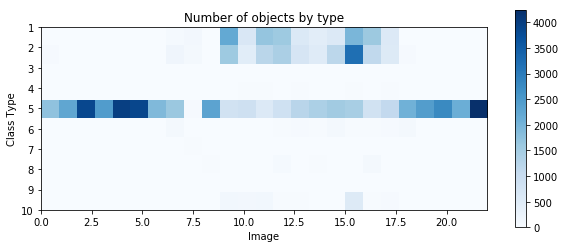

In [0]:
# plot
fig, ax = plt.subplots(figsize=(10, 4))
ax.set_aspect('equal')
plt.imshow(pvt.T, interpolation='nearest', cmap=plt.cm.Blues, extent=[0, 22, 10, 1])
plt.yticks(np.arange(1, 11, 1.0))
plt.title('Number of objects by type')
plt.ylabel('Class Type')
plt.xlabel('Image')
plt.colorbar()
plt.show()

__Observations:__

- Trees are present in almost all the given images.
- Also buildings, and other man made structures are present in half of the images.
- Objects like large, small vehicles and others are present in very less quantity.

- Waterway is present only in one image.

#### Visualization: Areas of the objects in training images

In [0]:
# https://github.com/rogerxujiang/dstl_unet

CLASSES = {1: 'Bldg', 2: 'Struct', 3: 'Road', 4: 'Track', 5: 'Trees', 6: 'Crops', 7: 'Fast H2O', 8: 'Slow H2O', 9: 'Truck', 10: 'Car'}

COLORS = {1: '0.7', 2: '0.4', 3: '#b35806', 4: '#dfc27d', 5: '#1b7837', 6: '#a6dba0', 7: '#74add1', 8: '#4575b4', 9: '#f46d43',  10: '#d73027'}

def get_polygon_list(image_id, class_type):
    '''
    Load the wkt data (relative coordiantes of polygons) from csv file and
    returns a list of polygons (in the format of shapely multipolygon)
    :param image_id:
    :param class_type:
    :return:
    '''
    
    all_polygon = train_df[train_df.ImageId == image_id]
    polygon = all_polygon[all_polygon.ClassType == class_type].MultipolygonWKT
    # For empty polygon, polygon is a string of 'MULTIPOLYGON EMPTY'
    # wkt.loads will automatically handle this and len(polygon_list) returns 0
    # But polygon_list will never be None!
    polygon_list = wkt.loads(polygon.values[0])

    return polygon_list

def get_image_area(image_id):
    '''
    Calculate the area of an image
    :param image_id:
    :return:
    '''
    
    xmax = grid_size_df[grid_size_df.ImageId == image_id].Xmax.values[0]
    ymin = grid_size_df[grid_size_df.ImageId == image_id].Ymin.values[0]

    return abs(xmax * ymin)

def image_stat(image_id):
    '''
    Return the statistics of an image as a pd dataframe
    :param image_id:
    :return:
    '''
    
    counts, total_area, mean_area, std_area = {}, {}, {}, {}
    img_area = get_image_area(image_id)

    for cl in CLASSES:
        polygon_list = get_polygon_list(image_id, cl)
        counts[cl] = len(polygon_list)
        if len(polygon_list) > 0:
            total_area[cl] = np.sum([poly.area for poly in polygon_list])\
                             / img_area * 100.
            mean_area[cl] = np.mean([poly.area for poly in polygon_list])\
                            / img_area * 100.
            std_area[cl] = np.std([poly.area for poly in polygon_list])\
                           / img_area * 100.

    return pd.DataFrame({'Class': CLASSES, 'Counts': counts,
                         'TotalArea': total_area, 'MeanArea': mean_area,
                         'STDArea': std_area})
    
def collect_stats():
    '''
    Collect the area statistics for all images and concatenate them
    :return:
    '''
    
    stats = []
    total_no = len(all_train_names) - 1

    for image_no, image_id in enumerate(all_train_names):
        stat = image_stat(image_id)
        stat['ImageId'] = image_id
        stats.append(stat)
        
    return pd.concat(stats)

def plot_bar_stats():
    
    stats = collect_stats()
    pvt = stats.pivot(index = 'Class', columns = 'ImageId', values = 'TotalArea')
    perc_area = np.cumsum(pvt, axis = 0)
    class_r = {}
    sns.set_style('white')
    sns.set_context({'figure.figsize': (12, 8)})

    for cl in CLASSES: class_r[CLASSES[cl]] = cl

    for cl in np.arange(1, 11):
        class_name = perc_area.index[-cl]
        class_id = class_r[class_name]
        ax = sns.barplot(x = perc_area.columns, y = perc_area.loc[class_name],
                         color = COLORS[class_id], label = class_name)
    ax.legend(loc = 2)
    sns.despine(left = True)
    ax.set_xlabel('Image ID')
    ax.set_ylabel('Class Type')
    ax.set_xticklabels(perc_area.columns, rotation = -60)
    plt.show()

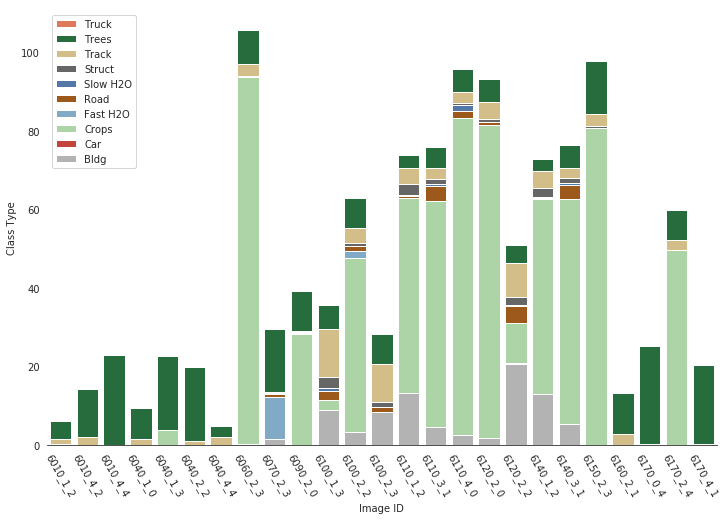

In [0]:
plot_bar_stats()

__Observations:__
- Crops corresponds to the largest area in an image where they are present followed by trees and tracks.
- Trees are there in all the training images.
- Buildings are present in 11 of the 25 training images.
- Water and vehicles classes are present in very less quantities.


#### Train Images

In [0]:
# 3-Band images
def stretch2(band, lower_percent=2, higher_percent=98):
    a = 0 #np.min(band)
    b = 255  #np.max(band)
    c = np.percentile(band, lower_percent)
    d = np.percentile(band, higher_percent)        
    out = a + (band - c) * (b - a) / (d - c)    
    out[out<a] = a
    out[out>b] = b
    return out

def adjust_contrast(x):    
    for i in range(3):
        x[:,:,i] = stretch2(x[:,:,i])
    return x.astype(np.uint8)  

def display_img(ImageID): 
  #Read 3-band image
  rgbfile=os.path.join( 'three_band', '{}.tif'.format(ImageID))              
  rgb = tiff.imread(rgbfile)
  rgb = np.rollaxis(rgb, 0, 3)     

  x = adjust_contrast(rgb).copy()

  #Plot
  fig, ax = plt.subplots(figsize=(5,5))
  ax.imshow(x)
  plt.title(f'Image {ImageID}')
  plt.axis('off')

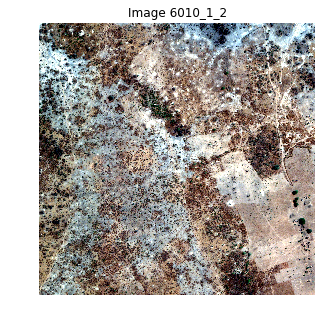

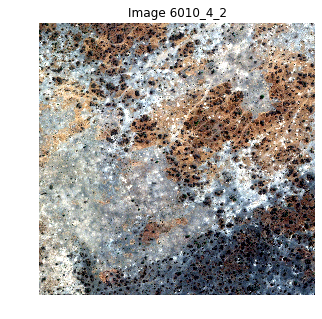

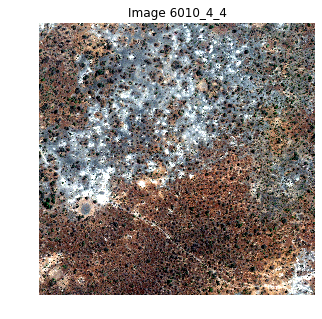

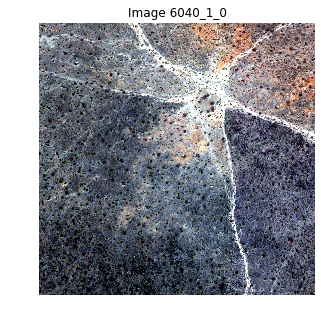

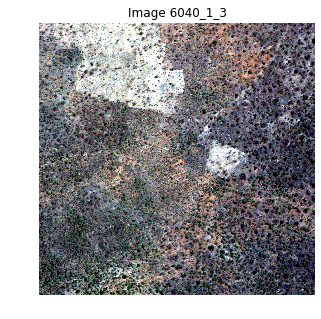

...

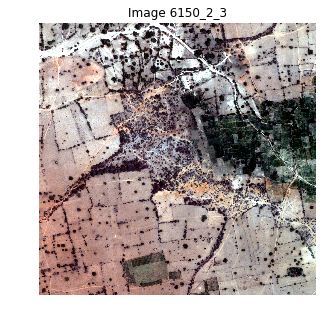

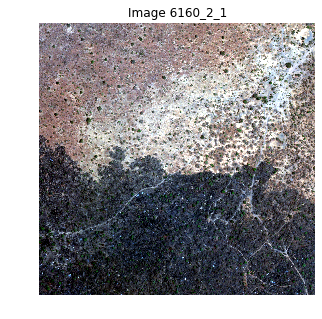

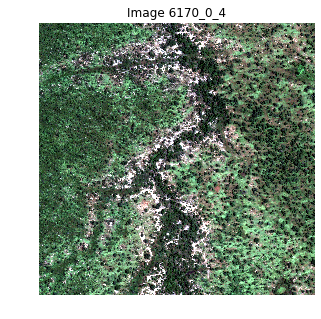

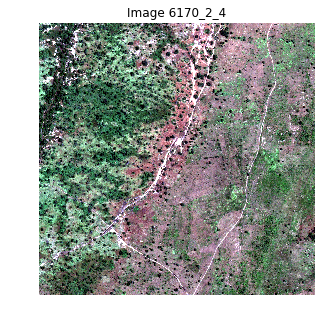

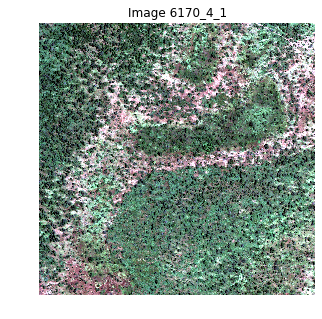

In [0]:
%matplotlib inline
for img in all_train_names:
  display_img(img)
plt.show()

#### Train images with object mask

In [0]:
def truth_polys(image_id, class_id, W, H):

    rows = train_df.loc[(train_df.ImageId==image_id) & (train_df.ClassType==class_id), 'MultipolygonWKT']
    mp = wkt.loads(rows.values[0])
    

    xmax, ymin = grid_size_df[grid_size_df.ImageId == image_id].iloc[0,1:].astype(float)    
    W_ = W * (W/(W+1.))
    H_ = H * (H/(H+1.))
    x_scaler = W_ / xmax
    y_scaler = H_ / ymin
    return affinity.scale(mp, xfact = x_scaler, yfact= y_scaler, origin=(0,0,0))  

def display_img_with_class(ImageID, Class): 
  #Read threeband image
  rgbfile=os.path.join( 'three_band', '{}.tif'.format(ImageID))              
  rgb = tiff.imread(rgbfile)
  rgb = np.rollaxis(rgb, 0, 3)     

  x = adjust_contrast(rgb).copy()

  H=len(x); W=len(x[0])
  #Read Polygons
  polys = truth_polys(ImageID, Class,W,H)

  #Add polygons to the x image --Edit: 01.25.17  included hole verteces in polygons 
  int_vertices=lambda x: np.array(x).round().astype(np.int32)
  for poly_id, poly in enumerate(polys):
      xys=int_vertices(poly.exterior.coords) 
      cv2.polylines(x,[xys],True,(255,0,0),3)
      for pi in poly.interiors:
          ixys=int_vertices(pi.coords)

  #Plot
  fig, ax = plt.subplots(figsize=(5, 5))
  ax.imshow(x)
  plt.title(f'Image {ImageID} with class {CLASSES.get(Class)} masked')
  plt.axis('off')

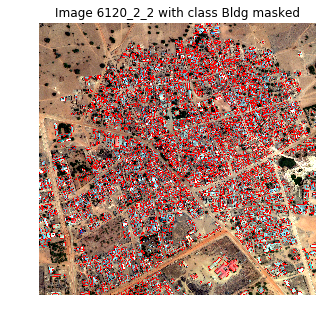

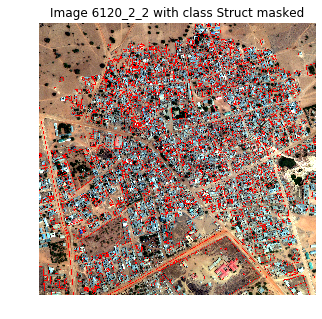

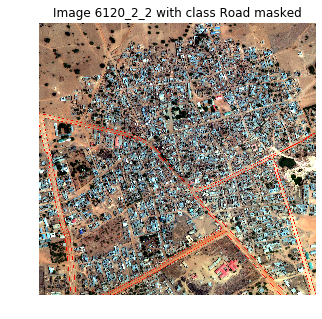

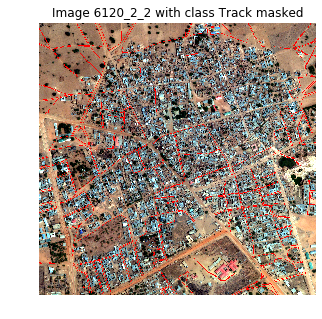

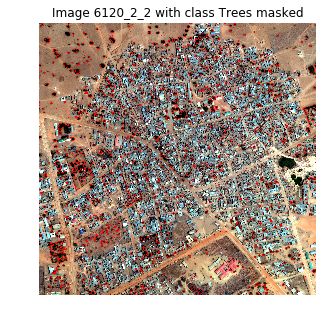

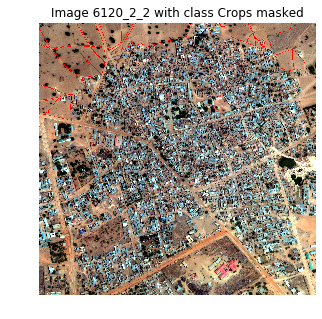

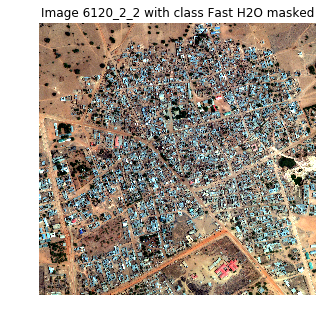

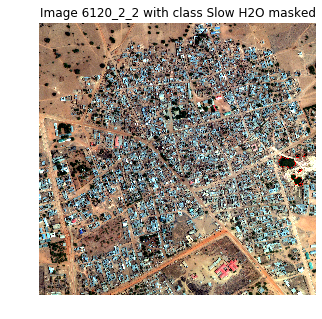

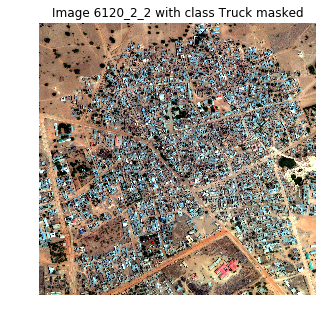

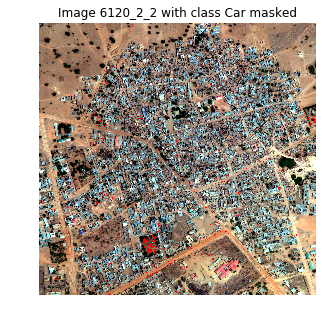

In [0]:
for i in range(1, 11):
  display_img_with_class('6120_2_2', i)

#### Plotting images from wkt multipoligon objects

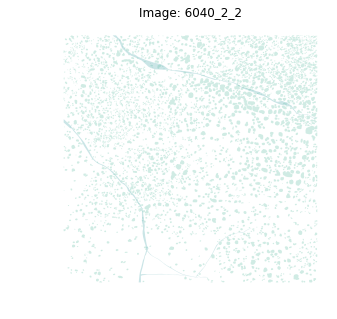

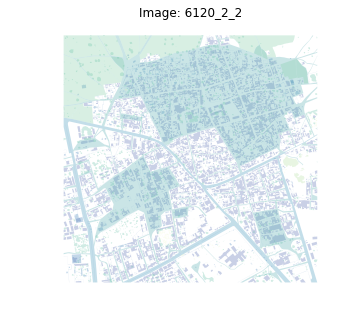

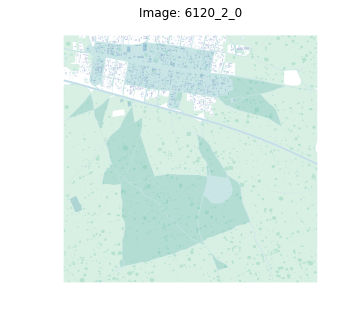

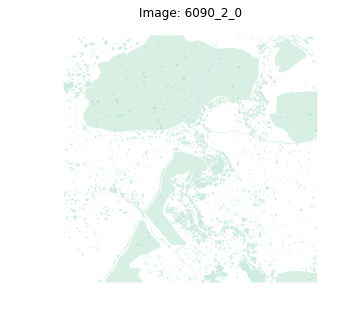

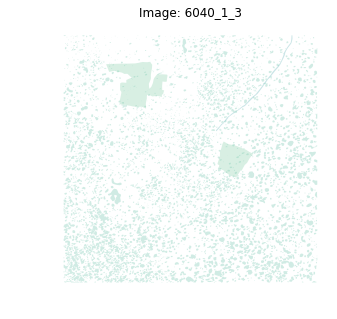

...

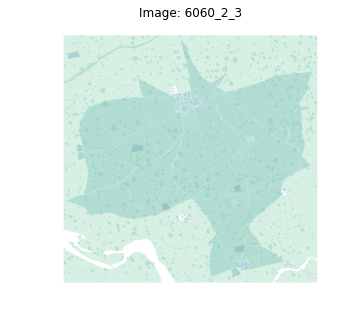

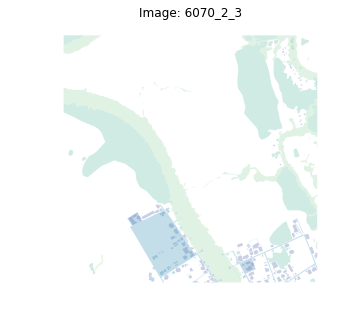

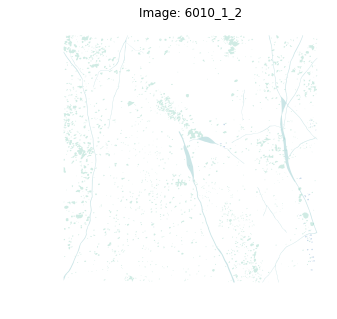

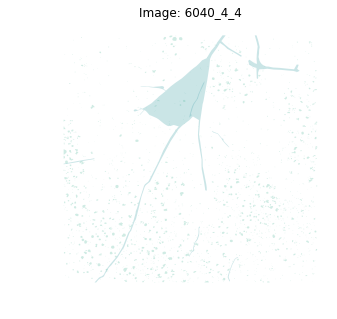

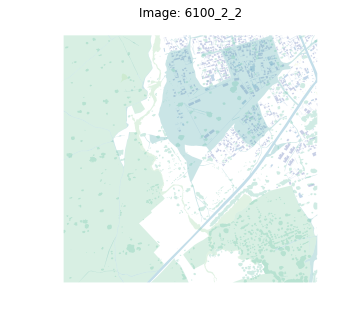

In [0]:
polygonsList = {}

for i, im in enumerate(train_df.ImageId.unique()):
    image = train_df[train_df.ImageId == im]
    for cType in image.ClassType.unique():
        polygonsList[cType] = loads(image[image.ClassType == cType].MultipolygonWKT.values[0])
    
    # plot using matplotlib
    fig, ax = plt.subplots(figsize=(5, 5))

    # plotting, color by class type
    for p in polygonsList:
        for polygon in polygonsList[p]:
            mpl_poly = Polygon(np.array(polygon.exterior), color=plt.cm.Spectral_r(p*10), lw=0, alpha=0.3)
            ax.add_patch(mpl_poly)
  
    ax.relim()
    ax.autoscale_view()
    plt.title(f'Image: {im}')
    plt.axis('off')
    plt.show()

### Conclusion

- We have seen some exploration and visualization of the given data in this notebook.
- Data summary:
  - We have been given 4 types of images:
    - RGB(3)
    - Panchromatic(1)
    - M-Band(8)
    - A-Band(8)
  - Training labels are in wkt format(Multipolygons) which defines different objects in the training images.
- Key observations:
  - Images in the training set are of different places and are very different in context.
  - Objects in the images are not in equal proportions.
  - Some classes are very rare like water bodies and vehicle classes.